# Name: Yahya Mahmoud Zakaria
# ID: 23011619
# Group: G1
## Note !!! : Storing data in Neo4j are in the cells below
## Note !!! : You can zoom to any plot and see all details as I increased dpi and size
You will need the following libraries:
- numpy
- pandas
- matplotlib
- quarify
- networkx
- plotly

### Repo: [GitHub](https://github.com/yahia997/Network-Analysis)

In [537]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [538]:
# to read all sheets
file = pd.ExcelFile("studentcourses.xlsx")
sheets = file.sheet_names
sheets

['علوم طبية ', 'صيدلة وطب اسنان', 'العلوم الادارية', 'الهندسة', 'حاسب الي']

In [539]:
df1 = pd.read_excel("studentcourses.xlsx", sheet_name=sheets[0])
df1.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,NaN,1105312002,عبدالمجيد علي عبدالرحمن الشاوي,السجلات الطبية-2,110501,المهارات اللغوية,ARAB 101,211637
1,NaN,1105311013,سالم سليمان دهش الشمري,السجلات الطبية-2,110501,المهارات اللغوية,ARAB 101,211637
2,NaN,1105312004,احمد عبدالله صالح الحربي,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,111647
3,NaN,1105321021,يوسف عبدالله سليمان المهوس,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,211647
4,NaN,1105312011,سطام بندر جايز المطيري,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,211647


In [540]:
df2 = pd.read_excel("studentcourses.xlsx", sheet_name=sheets[1])
df2.head()

,م,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,NaN,1.201321e+09,سعد عامر خضران الرشيدي,طب وجراحة الأسنان,120113.0,anatomy& histology,112 ana,212113.0
1,NaN,1.201321e+09,طارق حمود معجب الرشيدي,طب وجراحة الأسنان,120113.0,anatomy& histology,112 ana,212113.0
2,NaN,1.201321e+09,عبدالسلام فواز مقحم العقيلي المطيري,طب وجراحة الأسنان,120113.0,anatomy& histology,112 ana,212113.0
3,NaN,1.201321e+09,فهد سعود رباح الرشيدي,طب وجراحة الأسنان,120113.0,anatomy& histology,112 ana,212113.0
4,NaN,1.201321e+09,عبدالله دعيع عايض الرشيدي,طب وجراحة الأسنان,120113.0,anatomy& histology,112 ana,212113.0


In [541]:
df3 = pd.read_excel("studentcourses.xlsx", sheet_name=sheets[2])
df3.head()

,م,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,NaN,1302322004,عبدالعزيز صالح محمد الرميح,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
1,NaN,1302322009,معاذ معتق صالح الشملاني العنزي,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
2,NaN,1302321015,عبدالرحمن سليمان محمد الثنيان,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
3,NaN,1302322007,محمد عبدالعزيز عبدالله الربيش,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
4,NaN,1302322005,ابراهيم فهد ابراهيم الرباح,اللغات والترجمة,130225,APPLIED GRAMMAR2,ARAB102,113204


In [542]:
df4 = pd.read_excel("studentcourses.xlsx", sheet_name=sheets[3])
df4.head()

,م,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,NaN,1402311001,متعب عواد خضير الحربي,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
1,NaN,1402311010,ريان ناصر عبدالله العسيمي,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
2,NaN,1402311006,فيصل عبدالله سليمان الدرع,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
3,NaN,1402311007,سحمي سند سحمي السبيعي,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
4,NaN,1402311002,أحمد عبدالرحمن عبدالله اليوسف,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610


In [543]:
df5 = pd.read_excel("studentcourses.xlsx", sheet_name=sheets[4])
df5.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,م,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
1,1,1502302012,محمد سليمان محمد الخضيري,علوم الحاسب,150290,اختياري قسم,عال,215245
2,2,1502321001,عبدالله حمد ابراهيم الصائغ,علوم الحاسب,150286,اختياري قسم,عال,115242
3,3,1501321027,عبدالرحمن محمد ابراهيم العيسوي,هندسة الحاسب,150315,اختياري قسم,عال,115252
4,4,1501321027,عبدالرحمن محمد ابراهيم العيسوي,هندسة الحاسب,150316,اختياري قسم,عال,115253


In [544]:
# drop unwanted columns
df1.drop(['Unnamed: 0'], axis=1, inplace=True)
df5.drop(['Unnamed: 0'], axis=1, inplace=True)
df3.drop(['م'], axis=1, inplace=True)
df2.drop(['م'], axis=1, inplace=True)
df4.drop(['م'], axis=1, inplace=True)

df1.columns = df2.columns
df5.drop(0, axis=0, inplace=True)
df5.columns = df2.columns

In [545]:
df1.head()

,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,1105312002,عبدالمجيد علي عبدالرحمن الشاوي,السجلات الطبية-2,110501,المهارات اللغوية,ARAB 101,211637
1,1105311013,سالم سليمان دهش الشمري,السجلات الطبية-2,110501,المهارات اللغوية,ARAB 101,211637
2,1105312004,احمد عبدالله صالح الحربي,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,111647
3,1105321021,يوسف عبدالله سليمان المهوس,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,211647
4,1105312011,سطام بندر جايز المطيري,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,211647


In [546]:
# fix data types
df2['رقم الطالب'] = df2['رقم الطالب'].astype('Int64')
df2['رقم المقرر'] = df2['رقم المقرر'].astype('Int64')
df2['رقم الشعبة'] = df2['رقم الشعبة'].astype('Int64')

df2.head()

,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,1201321056,سعد عامر خضران الرشيدي,طب وجراحة الأسنان,120113,anatomy& histology,112 ana,212113
1,1201321047,طارق حمود معجب الرشيدي,طب وجراحة الأسنان,120113,anatomy& histology,112 ana,212113
2,1201321035,عبدالسلام فواز مقحم العقيلي المطيري,طب وجراحة الأسنان,120113,anatomy& histology,112 ana,212113
3,1201321037,فهد سعود رباح الرشيدي,طب وجراحة الأسنان,120113,anatomy& histology,112 ana,212113
4,1201321059,عبدالله دعيع عايض الرشيدي,طب وجراحة الأسنان,120113,anatomy& histology,112 ana,212113


In [547]:
df3.head()

,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,1302322004,عبدالعزيز صالح محمد الرميح,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
1,1302322009,معاذ معتق صالح الشملاني العنزي,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
2,1302321015,عبدالرحمن سليمان محمد الثنيان,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
3,1302322007,محمد عبدالعزيز عبدالله الربيش,اللغات والترجمة,130218,المهارات اللغوية,ARAB 101,113197
4,1302322005,ابراهيم فهد ابراهيم الرباح,اللغات والترجمة,130225,APPLIED GRAMMAR2,ARAB102,113204


In [548]:
df4.head()

,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,1402311001,متعب عواد خضير الحربي,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
1,1402311010,ريان ناصر عبدالله العسيمي,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
2,1402311006,فيصل عبدالله سليمان الدرع,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
3,1402311007,سحمي سند سحمي السبيعي,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610
4,1402311002,أحمد عبدالرحمن عبدالله اليوسف,اتصالات و إلكترونيات,240610,اتصالات الاقمار الصناعية,425 كهر,240610


In [549]:
df5.head()

,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
1,1502302012,محمد سليمان محمد الخضيري,علوم الحاسب,150290,اختياري قسم,عال,215245
2,1502321001,عبدالله حمد ابراهيم الصائغ,علوم الحاسب,150286,اختياري قسم,عال,115242
3,1501321027,عبدالرحمن محمد ابراهيم العيسوي,هندسة الحاسب,150315,اختياري قسم,عال,115252
4,1501321027,عبدالرحمن محمد ابراهيم العيسوي,هندسة الحاسب,150316,اختياري قسم,عال,115253
5,1502322007,أحمد محمد الجبيري الحربي,علوم الحاسب,150290,اختياري قسم,عال,215245


In [550]:
# merge all sheets into one dataframe
df = pd.concat([df1, df2, df3, df4, df5], axis=0)

In [551]:
df

,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
0,1105312002,عبدالمجيد علي عبدالرحمن الشاوي,السجلات الطبية-2,110501,المهارات اللغوية,ARAB 101,211637
1,1105311013,سالم سليمان دهش الشمري,السجلات الطبية-2,110501,المهارات اللغوية,ARAB 101,211637
2,1105312004,احمد عبدالله صالح الحربي,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,111647
3,1105321021,يوسف عبدالله سليمان المهوس,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,211647
4,1105312011,سطام بندر جايز المطيري,السجلات الطبية-2,110511,التحرير العربي,ARAB 102,211647
...,...,...,...,...,...,...,...
817,1501311010,أحمد عبدالعزيز محمد العبيدان,هندسة الحاسب,150147,هندسة البرمجيات,342عال,215153
818,1401321075,صالح محمد صالح الرميح,علوم الحاسب,150147,هندسة البرمجيات,342عال,115152
819,1502301005,يزيد محمد صالح الهجرس,علوم حاسب-1,150147,هندسة البرمجيات,342عال,115155
820,1502312010,محمد عبدالله محيميد العريني,علوم الحاسب,150147,هندسة البرمجيات,342عال,115152


In [ ]:
df.info()
# we can see we have missing values

<class 'pandas.core.frame.DataFrame'>
Index: 14790 entries, 0 to 821
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   رقم الطالب  11388 non-null  object
 1   اسم الطالب  11388 non-null  object
 2   التخصص      11388 non-null  object
 3   رقم المقرر  11388 non-null  object
 4   اسم المقرر  11388 non-null  object
 5   رمز المقرر  11388 non-null  object
 6   رقم الشعبة  11388 non-null  object
dtypes: object(7)
memory usage: 924.4+ KB


In [553]:
df.isnull().sum()

رقم الطالب    3402
اسم الطالب    3402
التخصص        3402
رقم المقرر    3402
اسم المقرر    3402
رمز المقرر    3402
رقم الشعبة    3402
dtype: int64

In [554]:
# drop null values
# as null values are in student id and course id
df.dropna(axis=0,inplace=True)
df.shape

(11388, 7)

In [555]:
# wrong values
df[df['اسم المقرر'] == 'اسم المقرر']

,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
99,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
100,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
101,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
102,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
103,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
...,...,...,...,...,...,...,...
379,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
380,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
381,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة
382,رقم الطالب,اسم الطالب,التخصص,رقم المقرر,اسم المقرر,رمز المقرر,رقم الشعبة


In [556]:
# drop them
df = df[df['اسم المقرر'] != 'اسم المقرر']

In [557]:
df['اسم المقرر'].value_counts()

اسم المقرر
النظام الإقتصادي في الإسلام               260
أسس النظام السياسي في الإسلام             210
المهارات اللغوية                          208
التحرير العربي                            189
الإسلام وبناء المجتمع                     125
                                         ... 
المدخل لحساب التفاضل                        1
النظم الذكية و تطبيقاتها لهندسة الحاسب      1
إدارة مشاريع البرمجيات                      1
GRAMMAR2                                    1
السلوك الانساني                             1
Name: count, Length: 461, dtype: int64

In [558]:
n = 15
v1 = df['اسم المقرر'].value_counts().sort_values(ascending=False)[:n]

x = list(v1.index)

In [559]:
import plotly.express as px
fig = px.bar(x=x, y=v1, title=f"Top {n} Courses")
fig.update_layout(
  xaxis_title=dict(text="Course title"),
  yaxis_title=dict(text="Number of students")
)

In [560]:
x = df['اسم المقرر'].value_counts()
mi = x.min()
ma = x.max()
print(ma)
print(mi)

260
1


In [561]:
bins = 30
intervals = np.linspace(mi, ma, bins).astype(int)

cutted = pd.cut(x.values, bins=intervals).value_counts()
cutted.index = cutted.index.map(lambda v: f"{v.left} to {v.right}").astype(str)
fig = px.bar(x=cutted.index, y=cutted.values, title="Number of courses in each number of students' interval")
fig.update_layout(
  xaxis_title=dict(text="Number of students"),
  yaxis_title=dict(text="Number of courses")  
)

In [562]:
vals = df['التخصص'].value_counts().to_frame().reset_index()
px.pie(vals, names='التخصص', values='count', title='Number of students in each department')

In [563]:
df.duplicated().sum()

0

#### To visualize the degree of each course

#### Applying coloring problem to display the exam schedule with no conficts

First we need to ensure that no student have more than one exam at the same period of the same day.

so I will draw edge between any 2 courses if at least one student enrolled to these two courses at the same semester.

when we draw an edge we mean that they will have two different colors after applying coloring algorithm and this means they have different exam time.

In [564]:
ids = df['رقم الطالب'].unique()

edges = set()

# go through each student
for id in ids:
  courses = df[df['رقم الطالب'] == id]['رمز المقرر']

  # get pairs
  for c1 in courses:
    for c2 in courses:

      # skip if they are the same course (usually not applicable)
      # student registered the same course twice
      if c1 == c2:
        continue

      edges.add((c1, c2)) # to eliminate duplicates (A, B) and (B, A)

edges = list(edges)
len(edges)

10516

In [565]:
dic = dict()

for e in edges:
  if dic.get(e):
    dic[e] += 1
  else:
    dic[e] = 1

to_store = []

for key, val in dic.items():
  to_store.append(('_' + re.sub(r"\W+", '_', key[0]),
                    '_' + re.sub(r"\W+", '_', key[1])))

In [566]:
edges

[('222 كمص', '328 صكل'),
 ('313 صيد', '415 صكل'),
 ('357كهر', '312كهر'),
 ('104سلم', '434بشر'),
 ('150نجم', '101كيم'),
 ('عال', '201كهر'),
 ('443بشر', '101بشر'),
 ('426كمص', '226 دوي'),
 ('313 صيد', '102سلم'),
 ('SP100', 'ED241'),
 ('HIMG 455', 'BIOL 101'),
 ('303نظم', '311نظم'),
 ('323 كلن', '114 نجم'),
 ('438 تيك', '421 هيل'),
 ('106ريض', '208كهر'),
 ('461 أشع', '341 أشع'),
 ('220 عال', '103سلم'),
 ('علوم2', '103فيز'),
 ('435بشر', '101كم'),
 ('444بشر', '333بشر'),
 ('205نظم', '302نظم'),
 ('430 صكل', '145نجم'),
 ('حسب413', 'حسب465'),
 ('467 صكل', '103سلم'),
 ('430كهر', '332كهر'),
 ('105هعم', '404هعم'),
 ('241MDS', '211SDS'),
 ('ENG1011', 'ENG915'),
 ('244 تمض', '227 تيك'),
 ('حسب441', 'نظم'),
 ('211 كمص', '109 ريض'),
 ('101قصد', '150نجم'),
 ('101 كلن', '227 تيك'),
 ('200 ريض', 'عال'),
 ('222 عقر', '322 دوي'),
 ('331بشر', '102سلم'),
 ('434صيد', '434عقر'),
 ('402نظم', '210نظم'),
 ('HIMG 432', 'HIMG 455'),
 ('103عرب', '341 هيل'),
 ('مال210', 'حسب301'),
 ('101كيم', '103فيز'),
 ('404هعم', '

## Deploy the graph to Neo4j

In [567]:
# Connect to neo4j instance
from neo4j import GraphDatabase
from dotenv import load_dotenv
import os

# load variables from .env file
load_dotenv()

# URI = os.getenv('NEO4J_URI')
# AUTH = (os.getenv('NEO4J_USERNAME'), os.getenv('NEO4J_PASSWORD'))

# with GraphDatabase.driver(URI, auth=AUTH) as driver:
#     driver.verify_connectivity()

True

In [568]:
# delete old data
# driver.execute_query("MATCH (n) DETACH DELETE n")

In [569]:
# def create_relationships(tx, relationships):
#     query = """
#     UNWIND $rels AS rel
#     MERGE (c1:Course {id: rel.course1})
#     MERGE (c2:Course {id: rel.course2})
#     MERGE (c1)-[r:CONNECTED_TO]->(c2)
#     """
#     params = {
#         "rels": [{
#             "course1": r[0],
#             "course2": r[1],
#         } for r in relationships]
#     }
#     tx.run(query, params)

In [570]:
# with driver.session() as session:
#     session.execute_write(create_relationships, to_store)

In [571]:
# execute some query to insure it is working
# out = driver.execute_query("""MATCH (_HIMG_303:Course)-[r:CONNECTED_TO]-(_HIMG_444:Course)
# RETURN _HIMG_303, _HIMG_444, r""")
# out

{'222 كمص': Text(0.3745401203632355, 0.9507142901420593, '222 كمص'),
 '328 صكل': Text(0.7319939136505127, 0.5986585021018982, '328 صكل'),
 '313 صيد': Text(0.15601864457130432, 0.15599451959133148, '313 صيد'),
 '415 صكل': Text(0.058083612471818924, 0.8661761283874512, '415 صكل'),
 '357كهر': Text(0.6011149883270264, 0.7080726027488708, '357كهر'),
 '312كهر': Text(0.02058449387550354, 0.9699098467826843, '312كهر'),
 '104سلم': Text(0.8324426412582397, 0.2123391181230545, '104سلم'),
 '434بشر': Text(0.1818249672651291, 0.18340450525283813, '434بشر'),
 '150نجم': Text(0.30424225330352783, 0.5247564315795898, '150نجم'),
 '101كيم': Text(0.4319450259208679, 0.29122912883758545, '101كيم'),
 'عال': Text(0.6118528842926025, 0.13949386775493622, 'عال'),
 '201كهر': Text(0.29214465618133545, 0.3663618564605713, '201كهر'),
 '443بشر': Text(0.4560699760913849, 0.7851759791374207, '443بشر'),
 '101بشر': Text(0.19967378675937653, 0.5142344236373901, '101بشر'),
 '426كمص': Text(0.5924145579338074, 0.04645041376

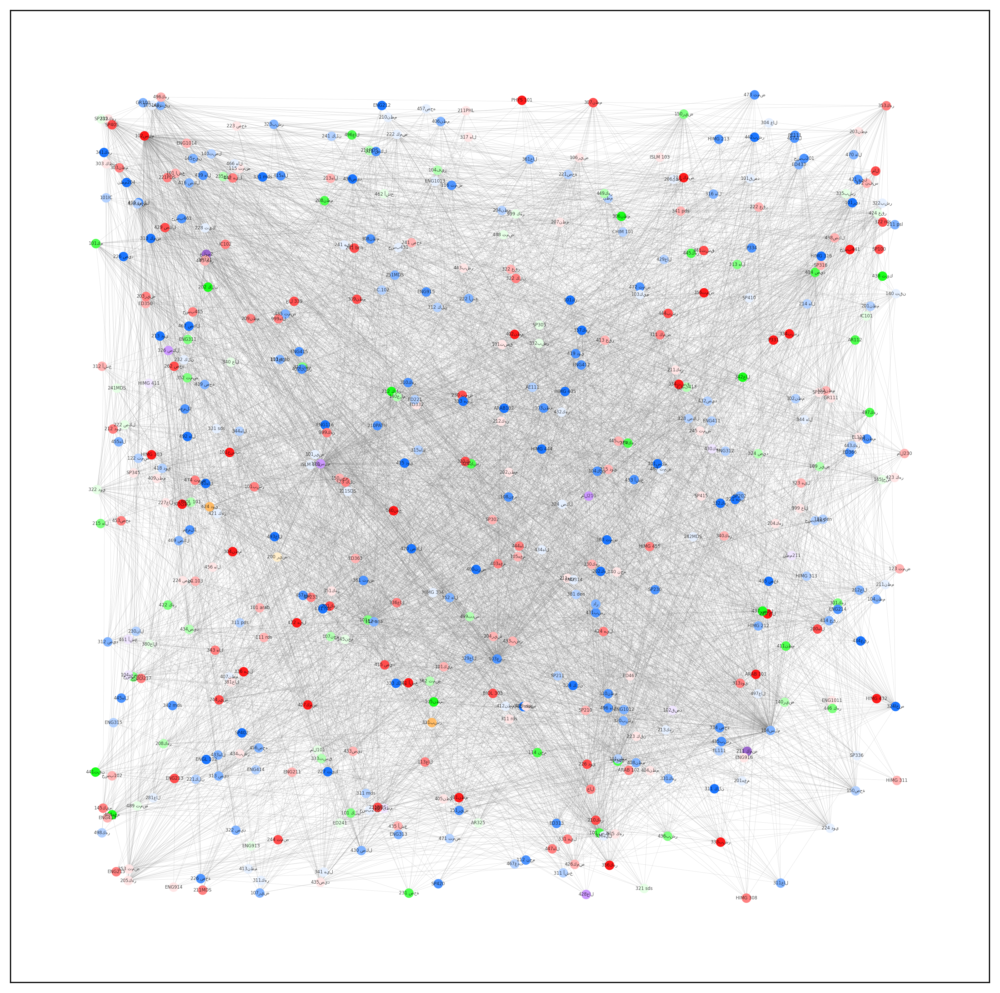

In [572]:
import time
g = nx.Graph()

plt.figure(figsize=(12, 12), dpi=400)

# some colors
colors = [
    '#E6F0FF',  
    '#B3D1FF',  
    '#80B3FF',  
    '#4D94FF',  
    '#1A75FF', 
    '#FFE6E6',  
    '#FFB3B3',
    '#FF8080',
    '#FF4D4D',
    '#FF1A1A',
    '#E6FFE6',
    '#B3FFB3',
    '#80FF80',
    '#4DFF4D',
    '#1AFF1A',
    '#F0E6FF',
    '#CC99FF',
    '#9966CC',
    '#FFEECC',
    '#FFBB66',
    '#FF8800',
    '#1A75FF', 
    '#FFE6E6',  
    '#FFB3B3',
    '#FF8080',
    '#FF4D4D',
    '#FF1A1A',
    '#E6FFE6',
    '#B3FFB3',
    '#80FF80',
    '#4DFF4D',
    '#1AFF1A',
    '#F0E6FF',
    '#CC99FF',
    '#9966CC',
    '#FFEECC',
    '#FFBB66',
    '#FF8800'
]


g.add_edges_from(edges)
pos = nx.random_layout(g, seed=42)

## greedy coloring largest first
s1 = time.time()
lables = list(nx.greedy_color(g, strategy="largest_first").values())
e1 = time.time()
count = set(lables)

for i in range(len(lables)):
  lables[i] = colors[lables[i]]

nx.draw_networkx_edges(g, pos, width=0.1, alpha=0.5, edge_color='gray')
nx.draw_networkx_nodes(g, pos, node_size=30, node_color=lables)
nx.draw_networkx_labels(g, pos, font_size=3, alpha=0.7)

## Visualize the degree of each course

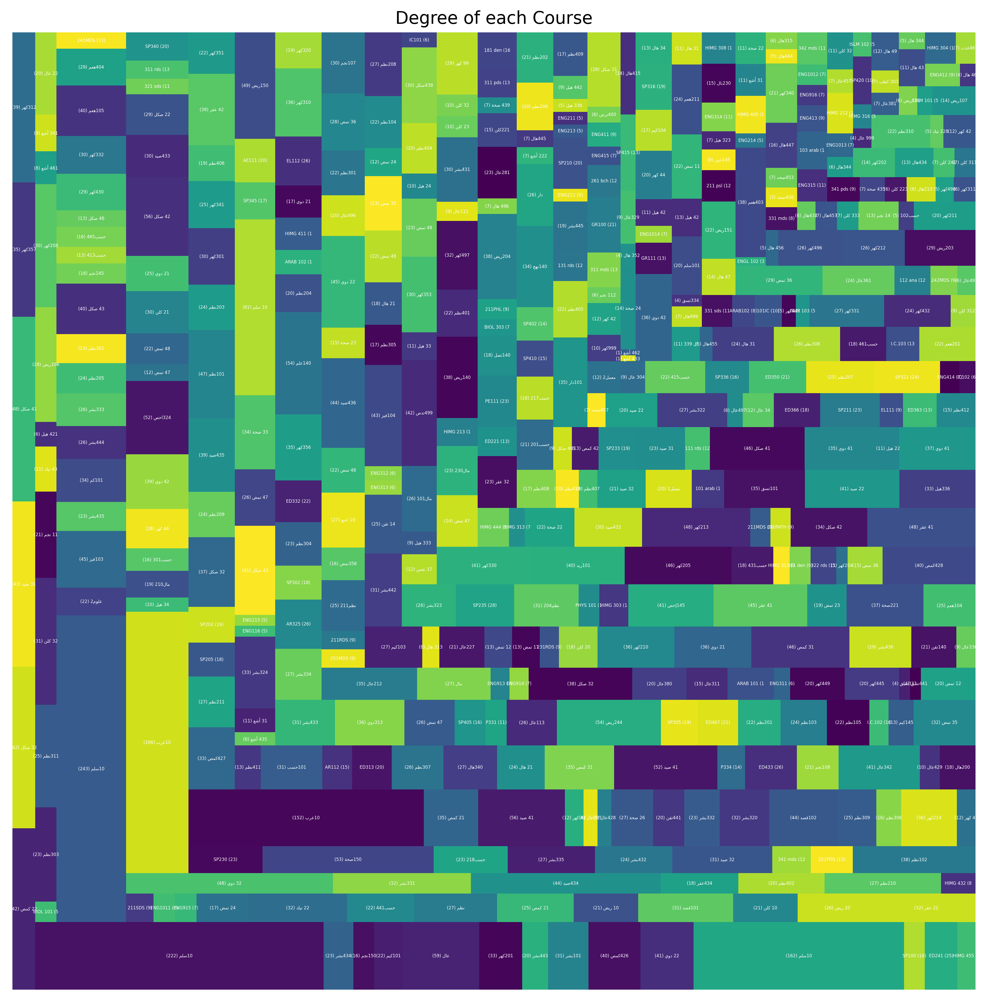

In [573]:
import squarify

# get degree of each course and separate them
# as numpy arrays have single type
# we can choose number of courses to make plot visible
degrees = np.array(g.degree())
co = degrees[:, 0]
deg = degrees[:, 1].astype(int)

## adjust arabic font
for i in range(len(co)):
  co[i] = get_display(arabic_reshaper.reshape(f"{co[i]} ({deg[i]})"))


plt.figure(figsize=(12,12), dpi=400)
squarify.plot(sizes=deg, label=co, text_kwargs={'fontsize': 3, 'color': 'white'})
plt.axis('off')
plt.title("Degree of each Course")
plt.show()

In [574]:
## Applying other coloring algorithms

## (greedy coloring smallest last)
s2 = time.time()
smallest = nx.greedy_color(g, strategy="smallest_last")
e2 = time.time()
smallest_count = set(smallest.values())

## (greedy coloring random_sequential)
s3 = time.time()
random = nx.greedy_color(g, strategy="random_sequential")
e3 = time.time()
random_count = set(random.values())

## (greedy coloring connected_sequential)
s4 = time.time()
connected = nx.greedy_color(g, strategy="connected_sequential")
e4 = time.time()
connected_count = set(connected.values())

## (greedy coloring saturation_largest_first)
s5 = time.time()
stlr = nx.greedy_color(g, strategy="DSATUR")
e5 = time.time()
stlr_count = set(stlr.values())

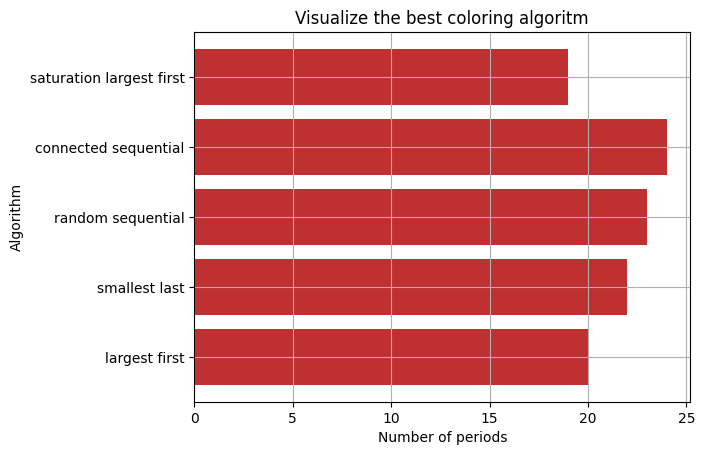

In [575]:
## Visualize results and number of periods required of each algorithm
# the best is the smallest number of periods (number of colors)

algorithm = ['largest first', 'smallest last', 'random sequential', 'connected sequential', 'saturation largest first']
periods_cnt = [len(count), len(smallest_count), len(random_count), len(connected_count), len(stlr_count)]
times = [e1-s1, e2-s2, e3-s3, e4-s4, e5-s5]

plt.barh(y=algorithm, width=periods_cnt, color="#BF3131")
plt.grid(visible=True)
plt.xlabel("Number of periods")
plt.ylabel("Algorithm")
plt.title("Visualize the best coloring algoritm")
plt.show()

I chosed "saturation largest first" as it has the smallest number of periods

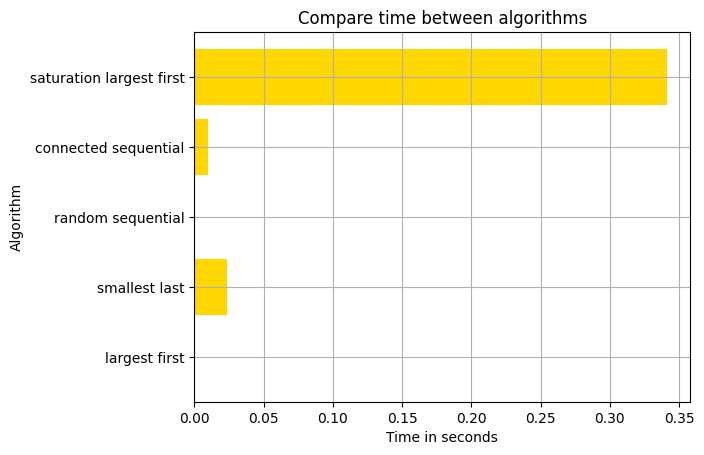

In [576]:
# compare time between algorithms
plt.barh(y=algorithm, width=times, color="gold")
plt.grid(visible=True)
plt.xlabel("Time in seconds")
plt.ylabel("Algorithm")
plt.title("Compare time between algorithms")
plt.show()

Lets assume the following constraints:
- we have only 5 periods per day

In [577]:
# rooms in our college :)
rooms = pd.DataFrame({
  "room name": ['420', '425', '305', '304', '408', '415', '407', '411', '203', '303', '407', '406', '405', 'طرقة الأمين', 'طرقة الألماني', 'طرقة معامل الدور الثالث', 'طرقة معامل الدور الرابع', 'طرقة الشؤون'],
  "capacity": [200, 200, 200, 200, 150, 100, 150, 100, 250, 250, 100, 40, 40, 30, 30, 50, 50, 50]
  })
rooms

,room name,capacity
0,420,200
1,425,200
2,305,200
3,304,200
4,408,150
5,415,100
6,407,150
7,411,100
8,203,250
9,303,250


In [578]:
# to get number of students in each course
l = df['رمز المقرر'].value_counts()

# group all course with the same color
# they can be in the same period
schedule = {}
for id in stlr.keys():
  
  # if not initialized
  if schedule.get(stlr[id]) is None: 
    schedule.setdefault(stlr[id],[])
  
  schedule[stlr[id]].append(id)
  

arr = []
period = 0

# caculate the number of periods needed
# after adding room constraints
# we can have only one course exam held in a room at the same period

# lets do some problem solving here :))))
for color, courses in schedule.items():
  i = 0
  for c in courses:

    student_enrolled = l[c] # number of studnents per course
    taken = [] # rooms that will be taken
    total_capacity = 0 # to count the total capacity of rooms that will be taken

    # fill untaken rooms in a period
    while(student_enrolled > 0 and i < rooms.shape[0]):
      student_enrolled -= rooms.loc[i]['capacity']
      taken.append(rooms.loc[i, 'room name'])
      total_capacity += rooms.loc[i]['capacity']

      i += 1

    # color requires another period (no other available rooms in this period)
    if student_enrolled > 0:
      i = 0  # as we start new period all rooms returns to be empty
      period += 1 # new period required
    else:
      arr.append([c, taken, period, color, l[c], total_capacity])

  # increase period to when courses in color finished to keep different colors separated
  # (means new period)
  period += 1
      
      
    
dff = pd.DataFrame(arr, columns=['course', 'rooms', 'period', 'color', 'needed capacity', 'available capacity'])
dff

,course,rooms,period,color,needed capacity,available capacity
0,103سلم,"[420, 425]",0,0,259,400
1,210كهر,[305],0,0,14,200
2,215 هال,[304],0,0,12,200
3,101حسب,[408],0,0,35,150
4,433بشر,[415],0,0,44,100
...,...,...,...,...,...,...
456,328 صكل,[420],35,17,35,200
457,420 صكل,[425],35,17,9,200
458,432صيد,[305],35,17,40,200
459,425 دوي,[420],36,18,19,200


each period is 1 hour and 30 min between every two periods

In [579]:
## add start and end time 
import datetime as dt
date = dt.datetime(2025, 4, 5, 9, 0) # first exam time
start = []
end = []

i = 0
while i < dff['period'].nunique():

  for j in range(6): # 6 (number of periods per day)
    start.append(date)
    end.append(date + dt.timedelta(hours=1))

    date += dt.timedelta(hours=1, minutes=30)
  
  i += 5
  date += dt.timedelta(days=1)

# add new 2 columns
dff = dff.assign(start = [start[j] for j in dff['period']], 
                 end = [end[j] for j in dff['period']])
dff

,course,rooms,period,color,needed capacity,available capacity,start,end
0,103سلم,"[420, 425]",0,0,259,400,2025-04-05 09:00:00,2025-04-05 10:00:00
1,210كهر,[305],0,0,14,200,2025-04-05 09:00:00,2025-04-05 10:00:00
2,215 هال,[304],0,0,12,200,2025-04-05 09:00:00,2025-04-05 10:00:00
3,101حسب,[408],0,0,35,150,2025-04-05 09:00:00,2025-04-05 10:00:00
4,433بشر,[415],0,0,44,100,2025-04-05 09:00:00,2025-04-05 10:00:00
...,...,...,...,...,...,...,...,...
456,328 صكل,[420],35,17,35,200,2025-04-12 13:30:00,2025-04-12 14:30:00
457,420 صكل,[425],35,17,9,200,2025-04-12 13:30:00,2025-04-12 14:30:00
458,432صيد,[305],35,17,40,200,2025-04-12 13:30:00,2025-04-12 14:30:00
459,425 دوي,[420],36,18,19,200,2025-04-13 15:00:00,2025-04-13 16:00:00


In [580]:
# we can see that capacity is managed properly
dff[dff['needed capacity'] > dff['available capacity']]

,course,rooms,period,color,needed capacity,available capacity,start,end


Finally we can deduce that we need 36/5 = 7.2 means 8 days
as 5 is number of periods

In [581]:
(dff['end'].max() - dff['start'].min()).days

8

In [582]:
import plotly.express as px

fig = px.timeline(
  dff, 
  x_start='start', 
  x_end='end', 
  y='course', 
  color='color', 
  hover_data=['rooms', 'needed capacity'],
  title="Final exam timetable (You can zoom to see details)"
  )
fig.update_yaxes(autorange="reversed")  
fig.update_layout(
  xaxis_title=dict(text="Time"),  
)    
fig.show()

In [583]:
# save schedule as csv
dff.to_csv("myoutput.csv")

# THANKS :))